In [2]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import random

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pathlib
import matplotlib.pyplot as plt

from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD
from tensorflow.keras.layers import BatchNormalization
from keras.layers import LeakyReLU

In [3]:
data_dir = pathlib.Path("train_images/")
data_dir

WindowsPath('train_images')

In [3]:
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count

2038

340


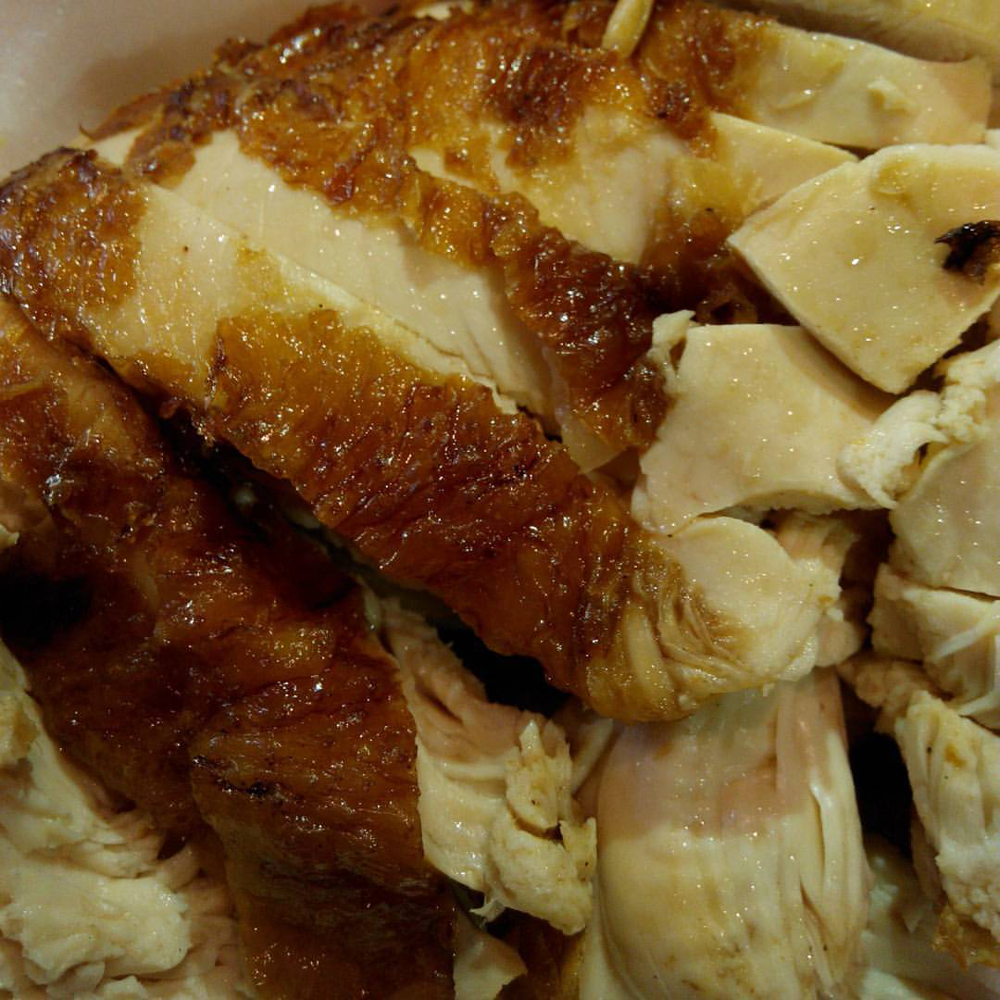

In [4]:
roasted_imgs = list(data_dir.glob('Roasted Chicken Rice/*.jpg'))
print(len(roasted_imgs))
PIL.Image.open(roasted_imgs[5])

340


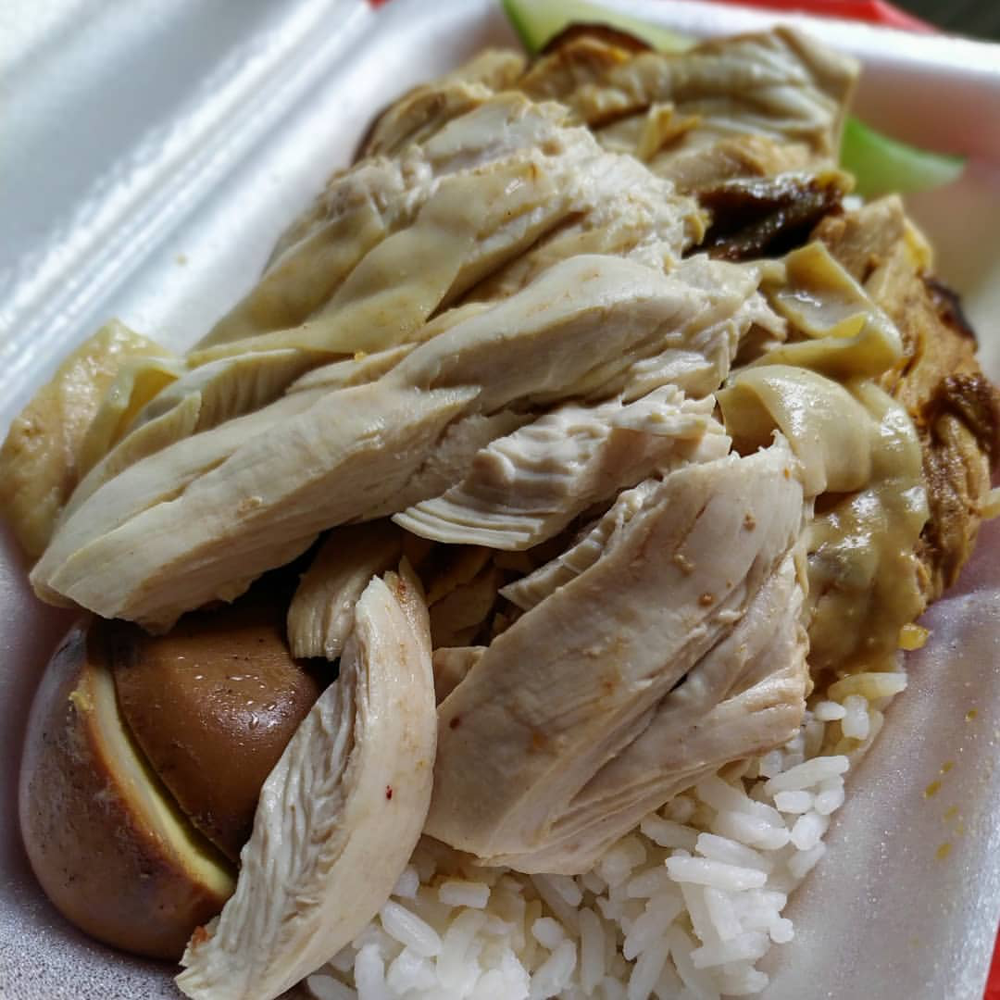

In [5]:
steamed_imgs = list(data_dir.glob('Steamed Chicken Rice/*.jpg'))
print(len(steamed_imgs))
PIL.Image.open(steamed_imgs[1])

319


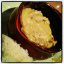

In [6]:
curry_imgs = list(data_dir.glob('Curry/*.jpg'))
print(len(curry_imgs))
PIL.Image.open(curry_imgs[1])

238


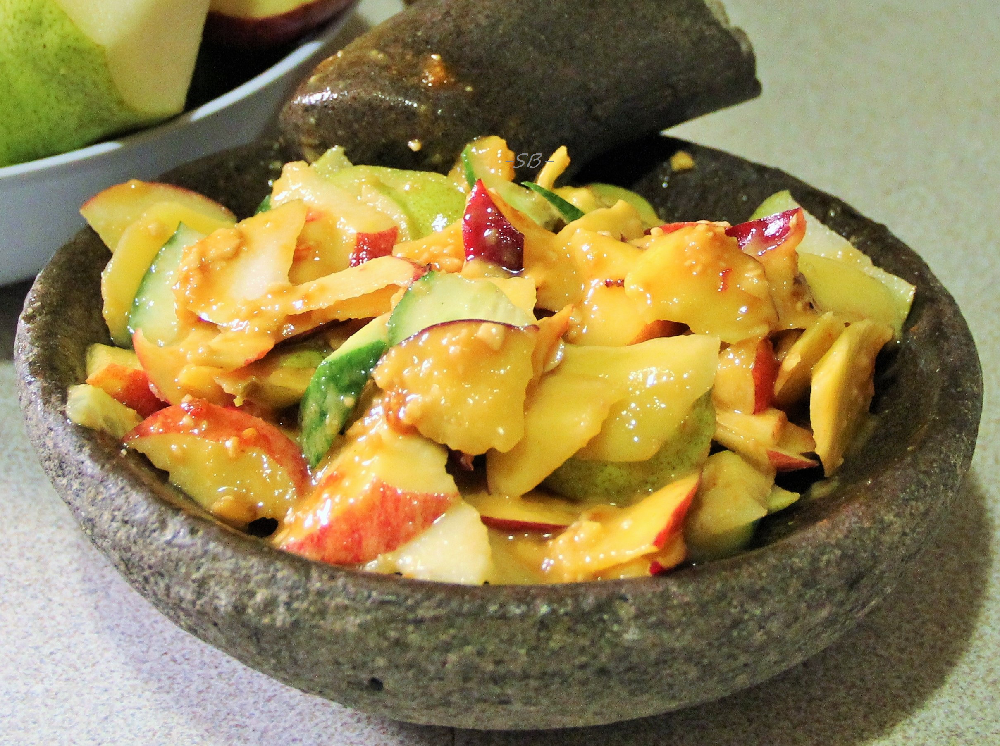

In [7]:
rojak_imgs = list(data_dir.glob('rojak/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

300


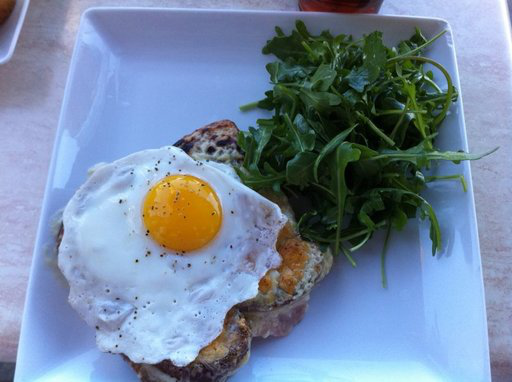

In [8]:
rojak_imgs = list(data_dir.glob('egg/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

300


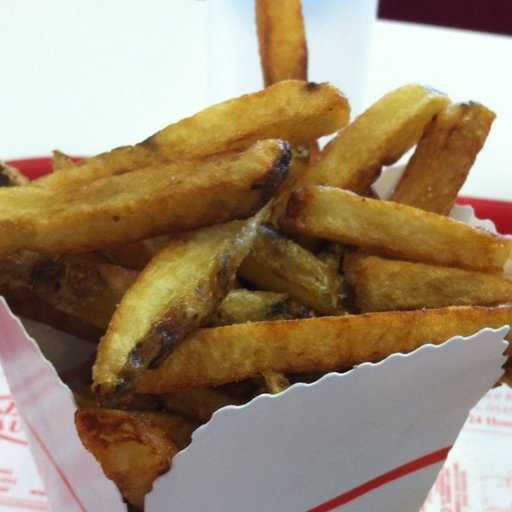

In [9]:
rojak_imgs = list(data_dir.glob('FrenchFries/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

201


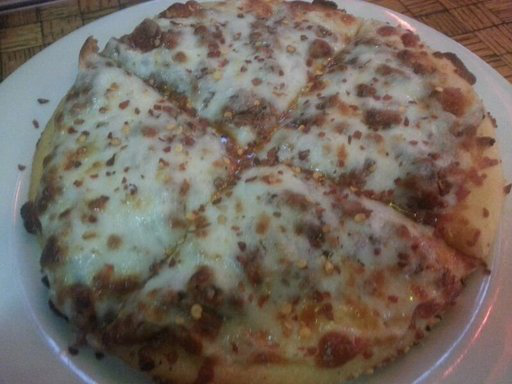

In [10]:
rojak_imgs = list(data_dir.glob('Pizza/*.jpg'))
print(len(rojak_imgs))
PIL.Image.open(rojak_imgs[1])

In [20]:
batch_size = 32
img_height = 224
img_width = 224

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

train_y = np.concatenate([y for x, y in train_ds], axis=0)

Found 2038 files belonging to 7 classes.
Using 1631 files for training.


In [21]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_y = np.concatenate([y for x, y in val_ds], axis=0)

Found 2038 files belonging to 7 classes.
Using 407 files for validation.


In [22]:
class_names = train_ds.class_names
print(class_names)


['Curry', 'Egg', 'FrenchFries', 'Pizza', 'Roasted Chicken Rice', 'Rojak', 'Steamed Chicken Rice']


<ipython-input-23-a6b502d18491>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(3, 3, i + 1)


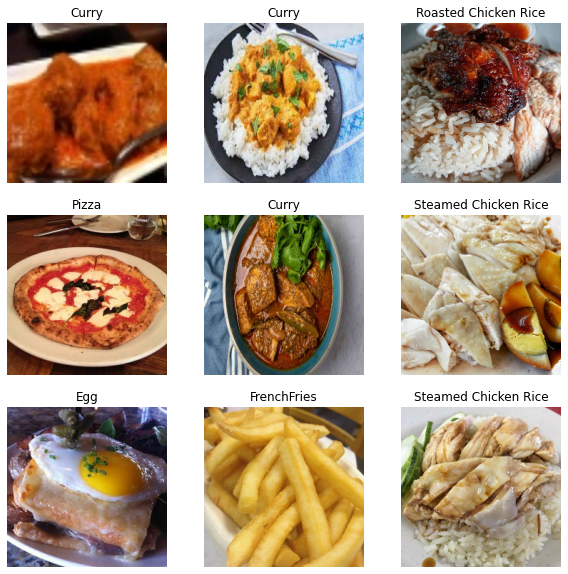

In [23]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(3):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [24]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


In [25]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [26]:
normalization_layer = layers.Rescaling(1./255)

In [27]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 0.9729286


In [32]:
num_classes = len(class_names)

data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

# THIS IS Jun Ming Code
#model = Sequential([
#  data_augmentation,
#  layers.Rescaling(1./255),
#  layers.Conv2D(16, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Conv2D(32, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Conv2D(64, 3, padding='same', activation='relu'),
#  layers.MaxPooling2D(),
#  layers.Dropout(0.2),
#  layers.Flatten(),
#  layers.Dense(128, activation='relu'),
#  layers.Dense(num_classes, name="outputs")
#])

vgg16 = keras.applications.vgg16
conv_model = vgg16.VGG16(weights='imagenet', 
                         include_top=False, 
                         input_shape=(224,224,3))

# conv_model = keras.applications.InceptionV3(weights='imagenet', 
#                                 include_top=False, 
#                                 input_shape=(224, 224,3))

for layer in conv_model.layers: 
    layer.trainable = False
x = keras.layers.Flatten()(conv_model.output)
# x = keras.layers.Dense(101, activation='relu')(x)
# x = keras.layers.Dense(101, activation='relu')(x)
# x = keras.layers.Dense(101, activation='relu')(x)
predictions = keras.layers.Dense(7, activation='softmax')(x)
model = keras.models.Model(inputs=conv_model.input, outputs=predictions)
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [33]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [34]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [35]:
from tensorflow.keras.callbacks import ModelCheckpoint

epochs=30

checkpointer = ModelCheckpoint(filepath='./best_model.hdf5', verbose=1, save_best_only=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[checkpointer]
)

Epoch 1/30
 5/51 [=>............................] - ETA: 3:36 - loss: 18.1803 - accuracy: 0.3938

KeyboardInterrupt: 

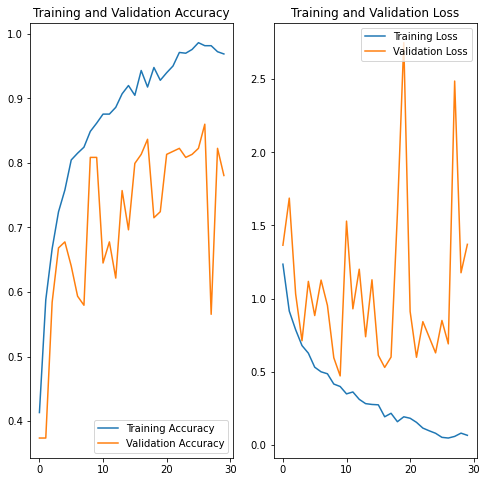

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
test_dir = pathlib.Path("test/")
test_imgs = list(test_dir.glob('*.jpg'))
len(test_imgs)

In [ ]:
img = tf.keras.utils.load_img(
        test_imgs[2], target_size=(img_height, img_width)
    )
img_array = tf.keras.utils.img_to_array(img)
img_array.shape

In [ ]:
plt.figure(figsize=(30, 30))
for i in range(len(test_imgs)):
    ax = plt.subplot(len(test_imgs) // 10 + 1, 10, i + 1)
    img = tf.keras.utils.load_img(
        test_imgs[i], target_size=(img_height, img_width)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    plt.imshow(img)
    predict = model.predict(img_array)
    score = tf.nn.softmax(predict[0])
    plt.title(format(class_names[np.argmax(score)]))
    plt.axis("off")